# Explore GRS images

## Load python libraries

In [1]:

import glob
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import xarray as xr
import rioxarray  # activate the rio accessor

#import cartopy
import cartopy.crs as ccrs
#import cartopy.feature as cfeature
#import locale
#locale.setlocale(locale.LC_ALL, 'en_US.utf8')
import matplotlib.pyplot as plt
import matplotlib as mpl
#mpl.use('TkAgg')

import hvplot.xarray
import pandas_bokeh
import holoviews as hv
import holoviews.operation.datashader as hd
from holoviews import opts
hv.extension('bokeh')
import datashader as ds
from datashader import transfer_functions as tf 
import colorcet as cc
import panel as pn
import panel.widgets as pnw
#import ipywidgets as widgets

import pyproj as ppj
import rasterio
from affine import Affine
from shapely.geometry import box,Point, mapping
from shapely.ops import transform


import grstbx
from grstbx import visual

u = grstbx.utils
opj = os.path.join
grstbx.__version__

## Set Dask local cluster

In [2]:
import dask.distributed
cluster = dask.distributed.LocalCluster()
client = dask.distributed.Client(cluster)
cluster.dashboard_link

'http://127.0.0.1:8787/status'

## Set images to play with

In [3]:

tile='31TGM'
select =grstbx.select_files()
# if you need to change the root path
select.root='/home/harmel/Dropbox/satellite/S2'
select.root='/media/harmel/TOSHIBA EXT/data/satellite'
select.list_tile(tile=tile,product='S2_L2B')
files = select.list_file_path(('2021-08','2021-12-01'))

In [4]:
files

array(['/media/harmel/TOSHIBA EXT/data/satellite/S2_L2B/31TGM/2021/08/02/S2B_MSIl2Bgpt_20210802T102559_N0301_R108_T31TGM_20210802T124113_cc073_v15.nc',
       '/media/harmel/TOSHIBA EXT/data/satellite/S2_L2B/31TGM/2021/08/05/S2B_MSIl2Bgpt_20210805T103629_N0301_R008_T31TGM_20210805T114243_cc091_v15.nc',
       '/media/harmel/TOSHIBA EXT/data/satellite/S2_L2B/31TGM/2021/08/07/S2A_MSIl2Bgpt_20210807T103031_N0301_R108_T31TGM_20210807T130730_cc099_v15.nc',
       '/media/harmel/TOSHIBA EXT/data/satellite/S2_L2B/31TGM/2021/08/10/S2A_MSIl2Bgpt_20210810T104031_N0301_R008_T31TGM_20210810T132749_cc003_v15.nc',
       '/media/harmel/TOSHIBA EXT/data/satellite/S2_L2B/31TGM/2021/08/12/S2B_MSIl2Bgpt_20210812T102559_N0301_R108_T31TGM_20210812T124236_cc000_v15.nc',
       '/media/harmel/TOSHIBA EXT/data/satellite/S2_L2B/31TGM/2021/08/15/S2B_MSIl2Bgpt_20210815T103629_N0301_R008_T31TGM_20210815T124403_cc016_v15.nc',
       '/media/harmel/TOSHIBA EXT/data/satellite/S2_L2B/31TGM/2021/08/17/S2A_MSIl2Bgpt_2

## Load and subset image series

In [5]:
# central coordinate
lon, lat = 6.56, 46.384
# size in meter of the rectangle of interest
width, height = 35000, 21000

ust = grstbx.utils.spatiotemp()
box = ust.wktbox(lon,lat, width=width, height=height, ellps='WGS84')
bbox = gpd.GeoSeries.from_wkt([box]).set_crs(epsg=4326)

# generate datacube
dc = grstbx.l2grs(files)

In [6]:
dc.load(subset=bbox,reshape=False)#,reproject=True)

## Check data/metadata

In [7]:
#dc.Rrs

## Check flags and masking

In [8]:
pn.widgets.DataFrame(pd.DataFrame.from_dict(dc.datacube.metadata.attrs,orient='index'),height=300)


DataFrame(height=300, value=              ...)

## Check flags and masking

In [9]:
masking_ = grstbx.masking(dc.datacube)
masking_.print_info()

,description,value,bit
name,,,
nodata,nodata in input image,1,0
negative,negative values in visible,2,1
ndwi,based on ndwi vis nir TOA based on bands B3 an...,4,2
ndwi_swir,based on ndwi nir swir TOA based on bandsB8A a...,8,3
high_nir,"high radiance in the nir band (e.g., cloud, sn...",16,4
hicld,high cloud as observed from cirrus band; condi...,32,5
moderate_cloud_risk_O2band,moderate risk of bright cloud as observed from...,64,6
high_cloud_risk_O2band,high risk of bright cloud as observed from O2 ...,128,7
L1_opaque_clouds,flag from L1 image,256,8


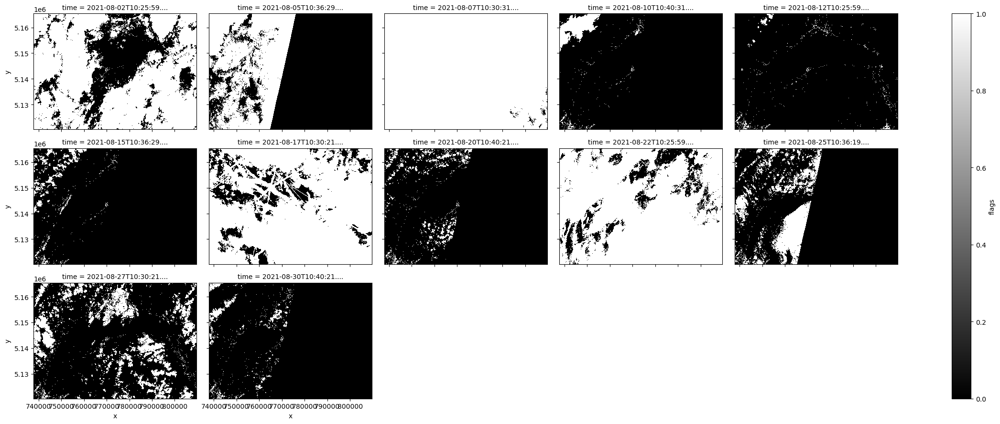

In [10]:
mask = (masking_.get_mask(high_nir=True) | masking_.get_mask(hicld=True)) 
aspect=1.5
mask.plot.imshow(col='time',col_wrap=5,vmin=0,cmap=plt.cm.binary_r,aspect=aspect)

## Mask datacube
Mask pixels from chosen flags and remove empty dates

In [11]:
masked = dc.datacube.where(mask==0).dropna('time','all')
masked

<xarray.Dataset>
Dimensions:               (time: 12, y: 2256, x: 3592)
Coordinates:
    spatial_ref           int64 0
  * x                     (x) float64 7.378e+05 7.378e+05 ... 8.096e+05
  * y                     (y) float64 5.165e+06 5.165e+06 ... 5.12e+06 5.12e+06
  * time                  (time) datetime64[ns] 2021-08-02T10:25:59.024000 .....
Data variables: (12/14)
    metadata              (time, y, x) float64 dask.array<chunksize=(1, 319, 155), meta=np.ndarray>
    flags                 (time, y, x) float64 dask.array<chunksize=(1, 319, 155), meta=np.ndarray>
    MCI                   (time, y, x) float32 dask.array<chunksize=(1, 319, 155), meta=np.ndarray>
    MCI_slope             (time, y, x) float32 dask.array<chunksize=(1, 319, 155), meta=np.ndarray>
    chl_git2008_sunglint  (time, y, x) float32 dask.array<chunksize=(1, 319, 155), meta=np.ndarray>
    chl_git2008           (time, y, x) float32 dask.array<chunksize=(1, 319, 155), meta=np.ndarray>
    ...                    ...
    NDCI                  (time, y, x) float32 dask.array<chunksize=(1, 319, 155), meta=np.ndarray>
    spm                   (time, y, x) float32 dask.array<chunksize=(1, 319, 155), meta=np.ndarray>
    turb                  (time, y, x) float32 dask.array<chunksize=(1, 319, 155), meta=np.ndarray>
    Kd_par                (time, y, x) float32 dask.array<chunksize=(1, 319, 155), meta=np.ndarray>
    acdom                 (time, y, x) float32 dask.array<chunksize=(1, 319, 155), meta=np.ndarray>
    crs                   (time, y, x) float64 dask.array<chunksize=(1, 319, 155), meta=np.ndarray>
Attributes:
    Conventions:       CF-1.4
    TileSize:          256:256
    product_type:      org.esa.s2tbx.processor.mci.S2MciOp
    metadata_profile:  beam
    metadata_version:  0.5
    start_date:        02-AUG-2021 10:25:59.024000
    stop_date:         02-AUG-2021 10:25:59.024000

In [24]:
del v
v=visual.view_param(masked)#,reproject=True)

In [25]:
v.visu()

Column
    [0] WidgetBox
        [0] Markdown(str)
        [1] Column
            [0] Row
                [0] Row
                    [0] Markdown(str)
                    [1] Select(options=['flags', 'MCI', ...], value='acdom')
                [1] Row
                    [0] Markdown(str)
                    [1] DatePicker(enabled_dates=[datetime.date(2021, ...], start=datetime.date(2021, 8, 2), value=datetime.date(2021, 8, 2))
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CartoDark', ...], value='StamenTonerBackground')
            [1] Row
                [0] Row
                    [0] Markdown(str)
                    [1] RangeSlider(end=10, name='Range Slider', step=0.0001, value=(0, 4), value_end=4)
                [1] Row
                    [0] Markdown(str)
                    [1] FloatSlider(name='Opacity', step=0.05, value=0.95)
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CET_D13', 'bky', ...], value='CET_D13')
    [1] HoloViews(DynamicMap)

## If you want to clip the raster image from the selected area of interest (last polygon drawn); otherwise skip this part.

In [29]:
v.aoi_stream.element.geom()

In [33]:
from shapely.geometry import Polygon
geom = v.aoi_stream.data
# if geom empty set it up by hand
geom ={'xs': [np.array([720070.41876771, 726306.6636905 , 725155.35693552, 719974.47653812,
         720070.41876771])],
 'ys': [np.array([5851780.8436506 , 5851780.8436506 , 5848806.63453357,
         5848902.57676315, 5851780.8436506 ])]}

ys,xs=geom['ys'][-1],geom['xs'][-1]
polygon_geom = Polygon(zip(xs, ys))
polygon = gpd.GeoDataFrame(index=[0], crs=3857, geometry=[polygon_geom]) 
geom_ = polygon.to_crs(3857)#Rrs_masked.rio.crs) #4326)#32631)#4326)
geom_.to_crs(4326).bounds

# if you want to subset within the box (defined from the polygon) uncomment the following lines
#minx, miny, maxx, maxy = geom_.bounds.values[0]
#Rrs_masked.sel(x=slice(minx, maxx), y=slice(maxy, miny))

,minx,miny,maxx,maxy
0,6.467641,46.425541,6.524524,46.443954


In [34]:
geom_.to_crs(masked.rio.crs)

,geometry
0,"POLYGON ((766410.050 5149223.101, 770712.673 5..."


In [35]:
#set geom coordinate system
geom_ = geom_.to_crs(masked.rio.crs)
clipped = masked.rio.clip(geom_.geometry.values)

In [37]:
h=visual.view_param(clipped,reproject=True)

In [38]:
h.visu()

Column
    [0] WidgetBox
        [0] Markdown(str)
        [1] Column
            [0] Row
                [0] Row
                    [0] Markdown(str)
                    [1] Select(options=['flags', 'MCI', ...], value='acdom')
                [1] Row
                    [0] Markdown(str)
                    [1] DatePicker(enabled_dates=[datetime.date(2021, ...], start=datetime.date(2021, 8, 2), value=datetime.date(2021, 8, 2))
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CartoDark', ...], value='StamenTonerBackground')
            [1] Row
                [0] Row
                    [0] Markdown(str)
                    [1] RangeSlider(end=10, name='Range Slider', step=0.0001, value=(0, 4), value_end=4)
                [1] Row
                    [0] Markdown(str)
                    [1] FloatSlider(name='Opacity', step=0.05, value=0.95)
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CET_D13', 'bky', ...], value='CET_D13')
    [1] HoloViews(DynamicMap)

In [91]:
stacked = clipped.stack(gridcell=["y", "x"]).dropna('gridcell','all')

In [92]:
stacked = stacked.as_numpy()

In [96]:

def compute_stats(xarr, stat_coord='gridcell',limits=[-np.inf,np.inf],dropna=True,time_coord='time'):
    xarr = xarr.where((xarr>limits[0])&(xarr<limits[1]))
    stats = xr.Dataset({'median':xarr.median(stat_coord)})
    stats['q25'] = xarr.quantile(0.25,dim=stat_coord)
    stats['q75'] = xarr.quantile(0.75,dim=stat_coord)
    stats['min'] = xarr.min(stat_coord)
    stats['max'] = xarr.max(stat_coord)
    stats['mean'] = xarr.mean(stat_coord)
    stats['std'] = xarr.std(stat_coord)
    stats['pix_num'] = xarr.count(stat_coord)
    if dropna:
        return stats.dropna(time_coord)
    else:
        return stats


Compute statitics for a given parameter, you can set the lower and upper limits of the valid data range:

In [97]:
param='chl_OC2E'
stats = compute_stats(stacked[param],limits=[0.01,1000])

/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1583: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1878: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Check the outcomes before plotting

In [83]:
df = stats.to_dataframe()#.reset_index()
pn.widgets.DataFrame(df,height=300,width=1200)

DataFrame(height=300, sizing_mode='fixed', value=              ..., width=1200)

Plot time series

In [99]:
import pandas_bokeh
df = stats.to_dataframe()
df[['q25','median','q75']].plot_bokeh(ylabel=param,figsize=(1000, 500),plot_data_points=True,colormap=["grey", "black","grey"],rangetool=True)

Column(id='7922', ...)

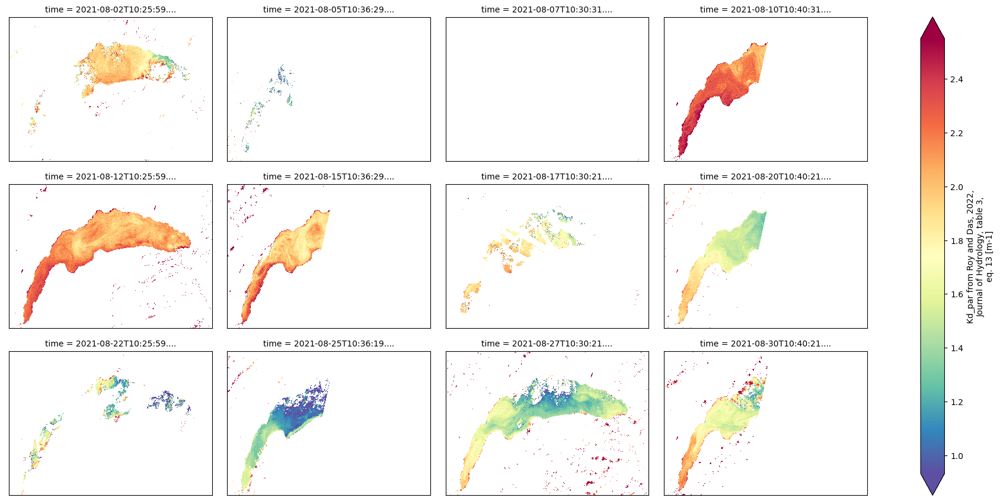

In [15]:
param="Kd_par"
fig = masked[param].plot.imshow(col='time', cmap=plt.cm.Spectral_r,col_wrap=4,robust=True,aspect=aspect)
for ax in fig.axs.flat:
    ax.set(xticks=[], yticks=[])
    ax.set_ylabel('')
    ax.set_xlabel('')
fig


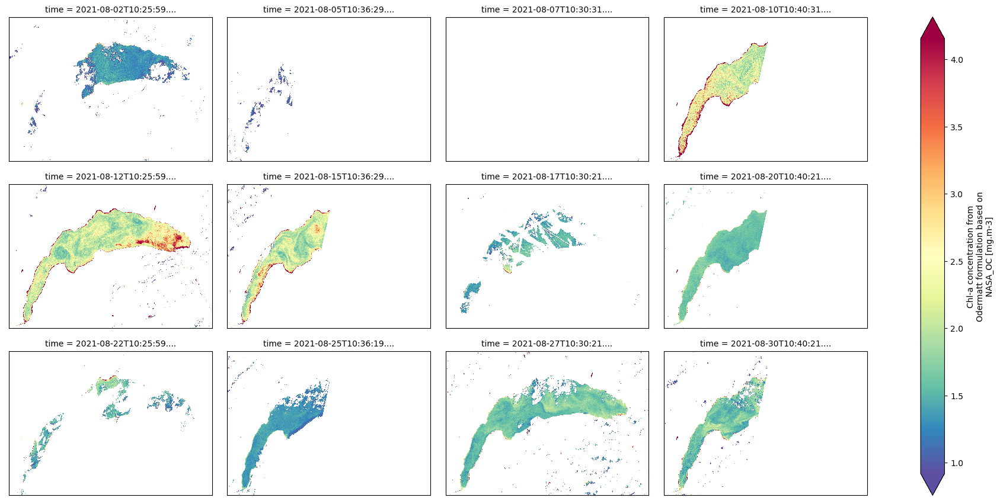

In [16]:
param="chl_OC2E"
fig = masked[param].plot.imshow(col='time', cmap=plt.cm.Spectral_r,col_wrap=4,robust=True,aspect=aspect)
for ax in fig.axs.flat:
    ax.set(xticks=[], yticks=[])
    ax.set_ylabel('')
    ax.set_xlabel('')
fig

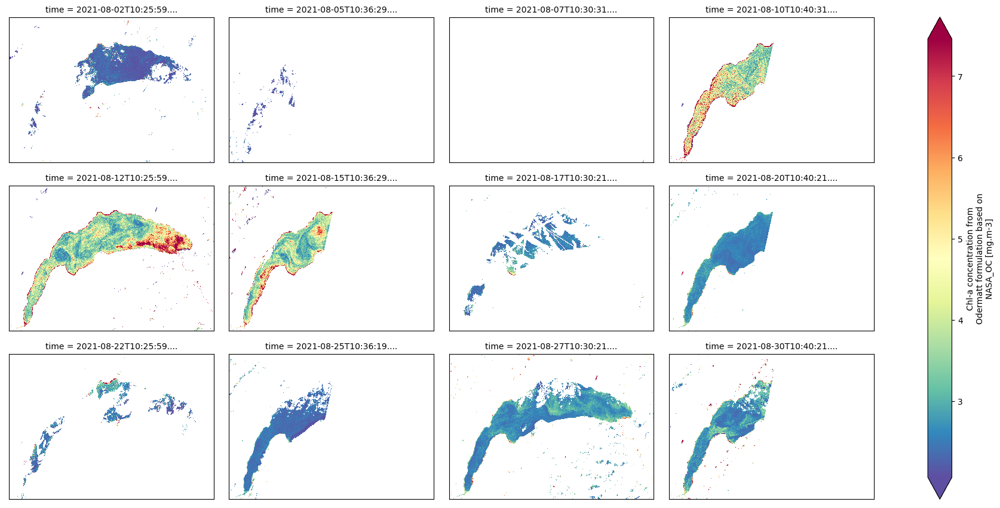

In [17]:
param="chl_OC2_odermatt"
fig = masked[param].plot.imshow(col='time', cmap=plt.cm.Spectral_r,col_wrap=4,robust=True,aspect=aspect)
for ax in fig.axs.flat:
    ax.set(xticks=[], yticks=[])
    ax.set_ylabel('')
    ax.set_xlabel('')
fig

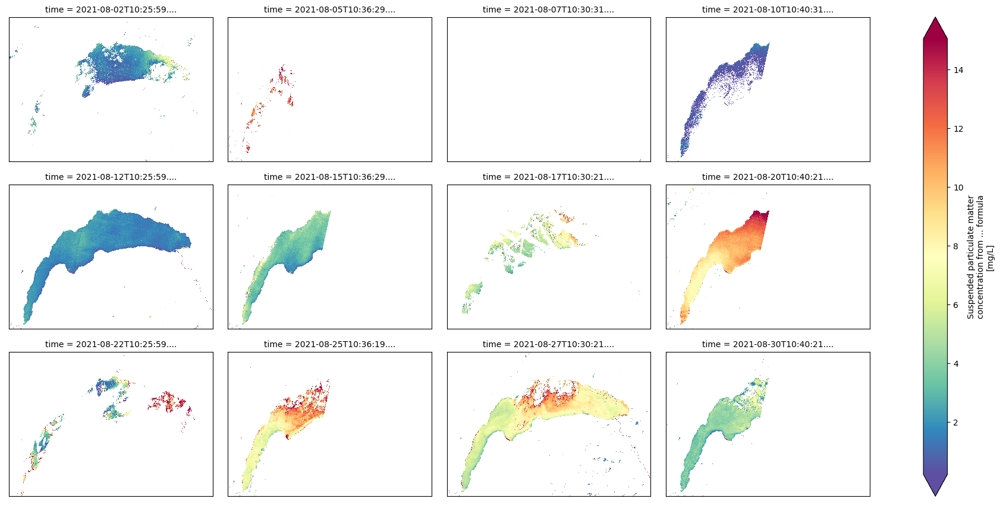

In [18]:
param="spm"
fig = masked[param].plot.imshow(col='time', cmap=plt.cm.Spectral_r,col_wrap=4,robust=True,aspect=aspect)
for ax in fig.axs.flat:
    ax.set(xticks=[], yticks=[])
    ax.set_ylabel('')
    ax.set_xlabel('')
fig

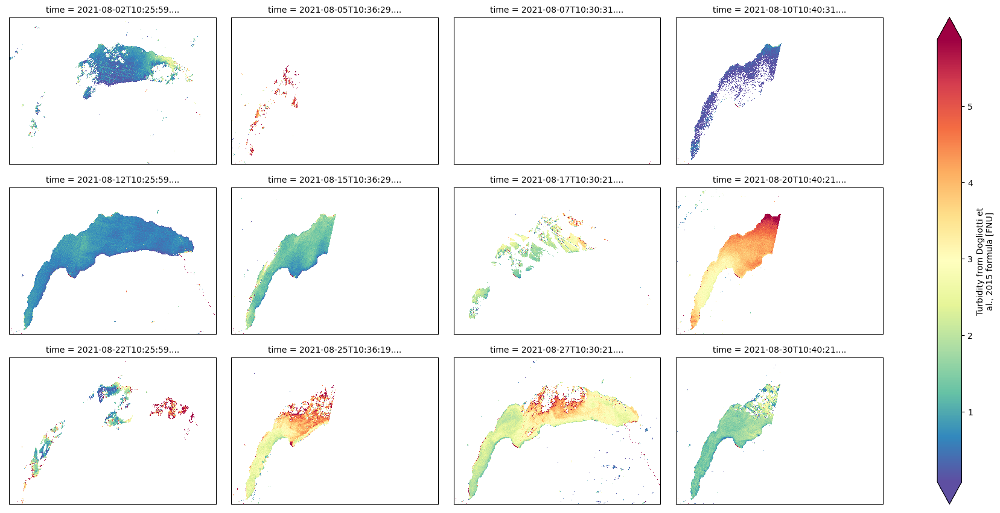

In [19]:
param="turb"
fig = masked[param].plot.imshow(col='time', cmap=plt.cm.Spectral_r,col_wrap=4,robust=True,aspect=aspect)
for ax in fig.axs.flat:
    ax.set(xticks=[], yticks=[])
    ax.set_ylabel('')
    ax.set_xlabel('')
fig

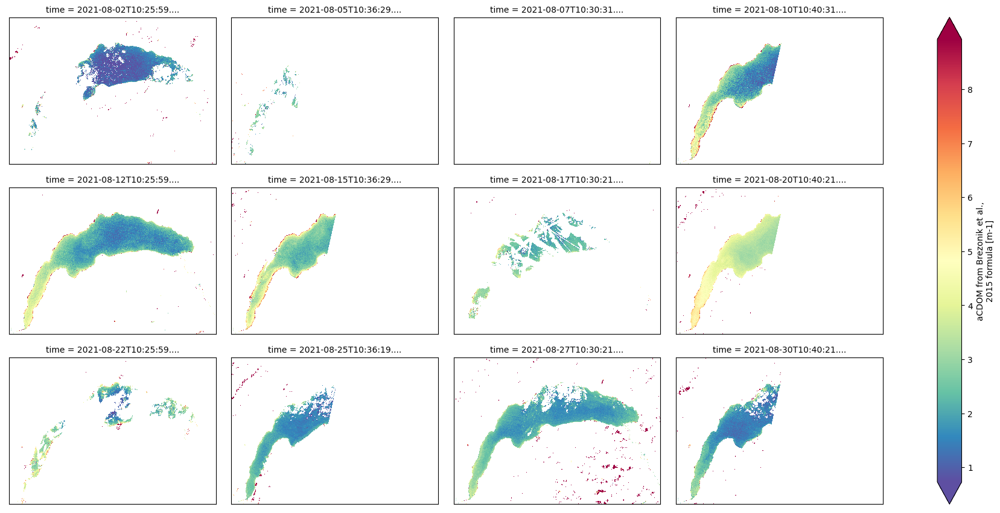

In [20]:
param='acdom'
fig = masked[param].plot.imshow(col='time', cmap=plt.cm.Spectral_r,col_wrap=4,robust=True,aspect=aspect)
for ax in fig.axs.flat:
    ax.set(xticks=[], yticks=[])
    ax.set_ylabel('')
    ax.set_xlabel('')
fig